# EXPERIMENT - STATE-GROUP-2

# State Groups:

- `group_1`: Patients with low toxicity and low tumor size  - W_0 ~ N(0.5, 0.16**2), T_0 ~ N(0.5, 0.16**2)
- `group_2`: Patients with high toxicity and low tumor size - W_0 ~ N(1.5, 0.16**2), T_0 ~ N(0.5, 0.16**2)
- `group_3`: Patients with low initial toxicity and high tumor size - W_0 ~ N(0.5, 0.16**2), T_0 ~ N(1.5, 0.16**2)
- `group_4`: Patients with high toxicity and high tumor size - W_0 ~ N(1.5, 0.16**2), T_0 ~ N(1.5, 0.16**2)
-  `None`  : Patients with toxicity and tumor size sample from - W_0 ~ U(0,2), T_0 ~  U(0,2)

In [1]:
%load_ext autoreload
%autoreload 2

import tqdm
import _set_path
from pbpi.algo_core.training import evaluations_per_config

In [2]:
ALGO_TYPE = {'original': {'name': 'original', 'exploration': False}
            ,'modified': {'name': 'modified', 'exploration': True} }

---
## Original experiment setup

### Original algorithm

In [3]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 1
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': 'group_2'
          , 'init_state_tag': 'g2'
          }

algorithm = ALGO_TYPE['original']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 3


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


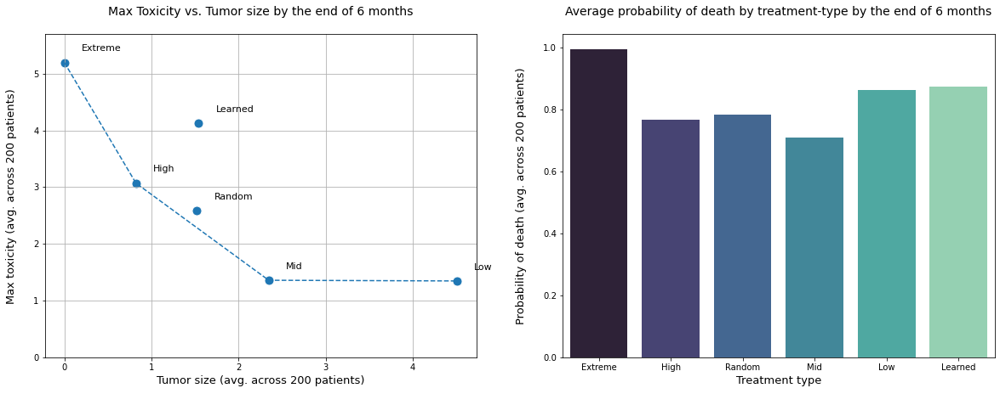

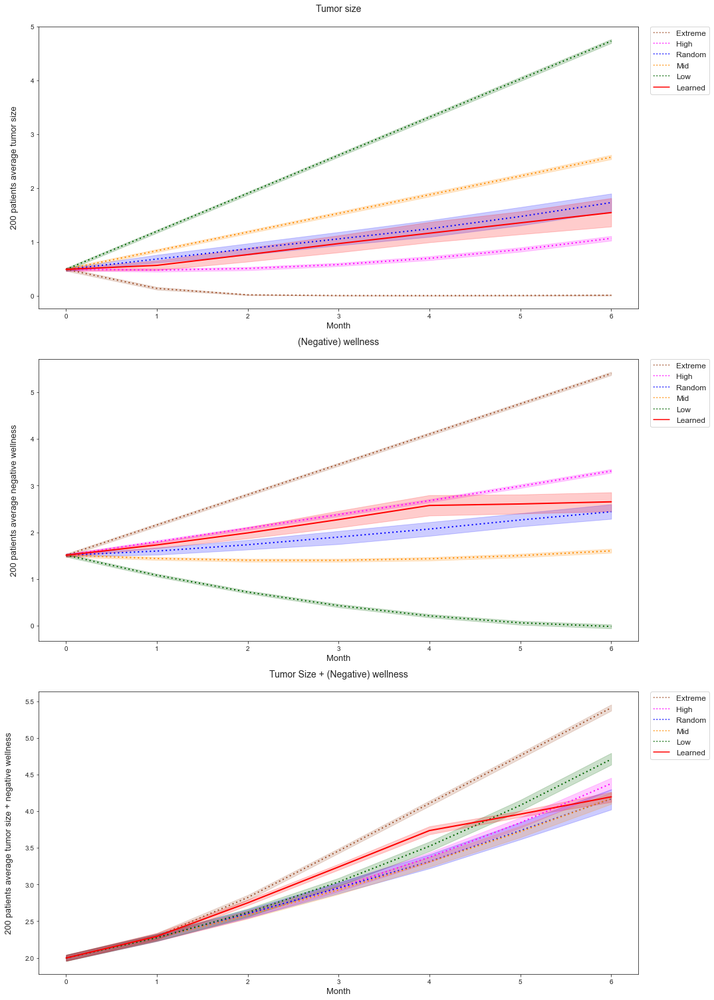


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 1.5421912916305311
                         - Avg. max. toxicity : 4.120394561102687
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1590095822457105
                         - Avg. prob. of death : 0.8753202265599472



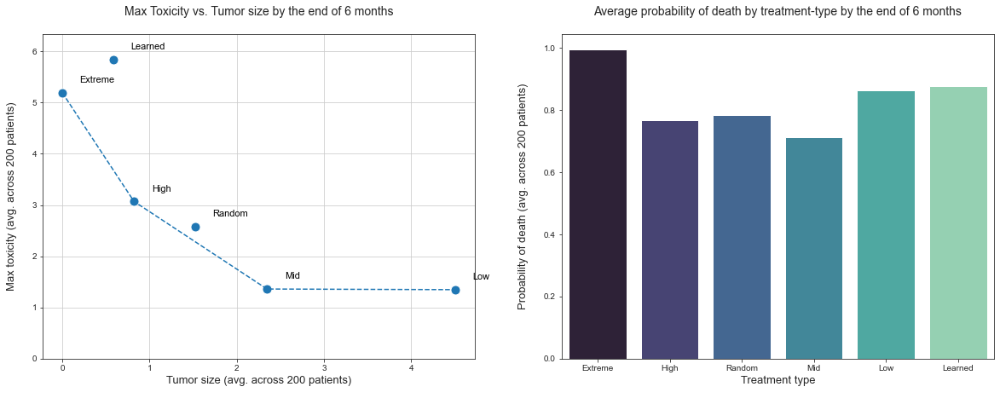

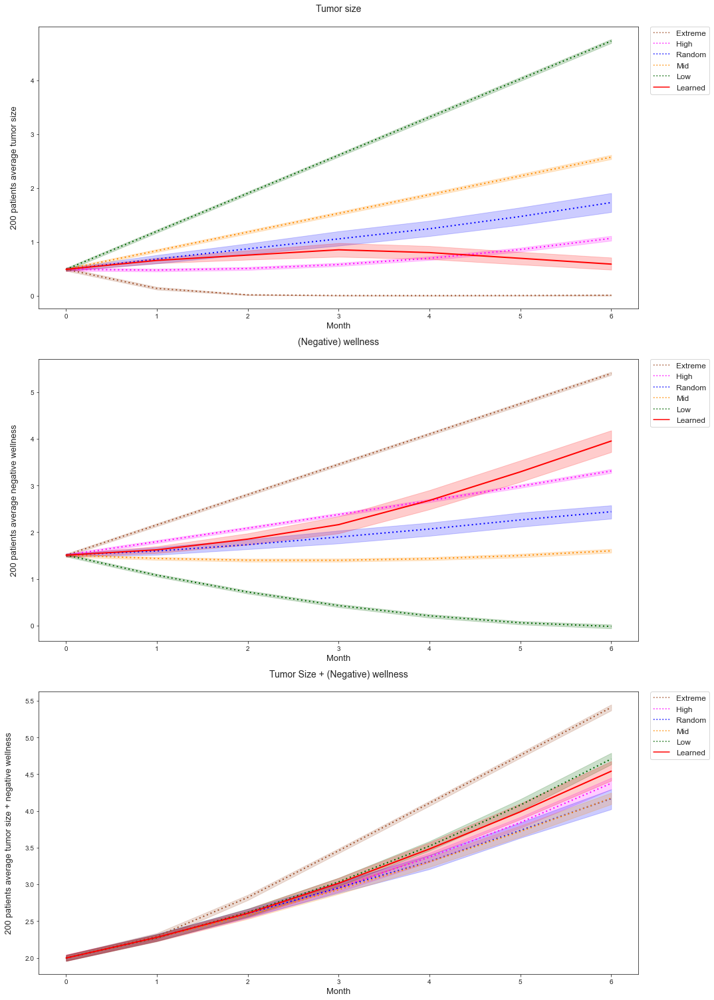


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 0.5861787255490839
                         - Avg. max. toxicity : 5.8390197116141
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1528144382458794
                         - Avg. prob. of death : 0.8757350326617187



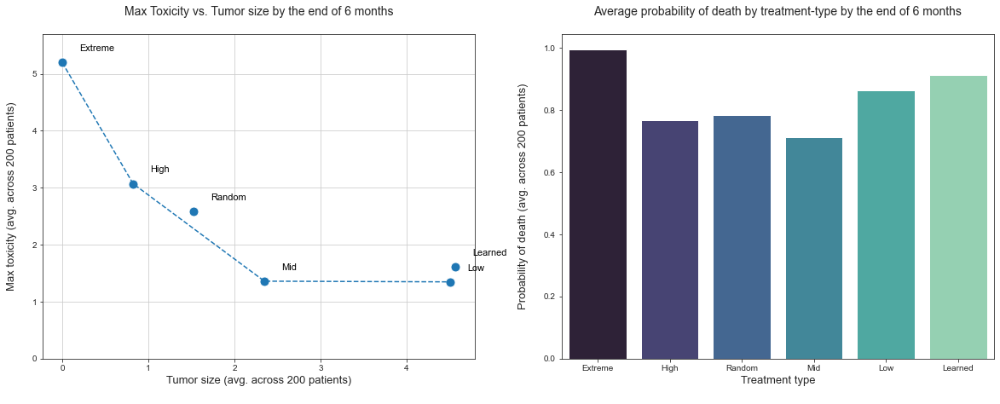

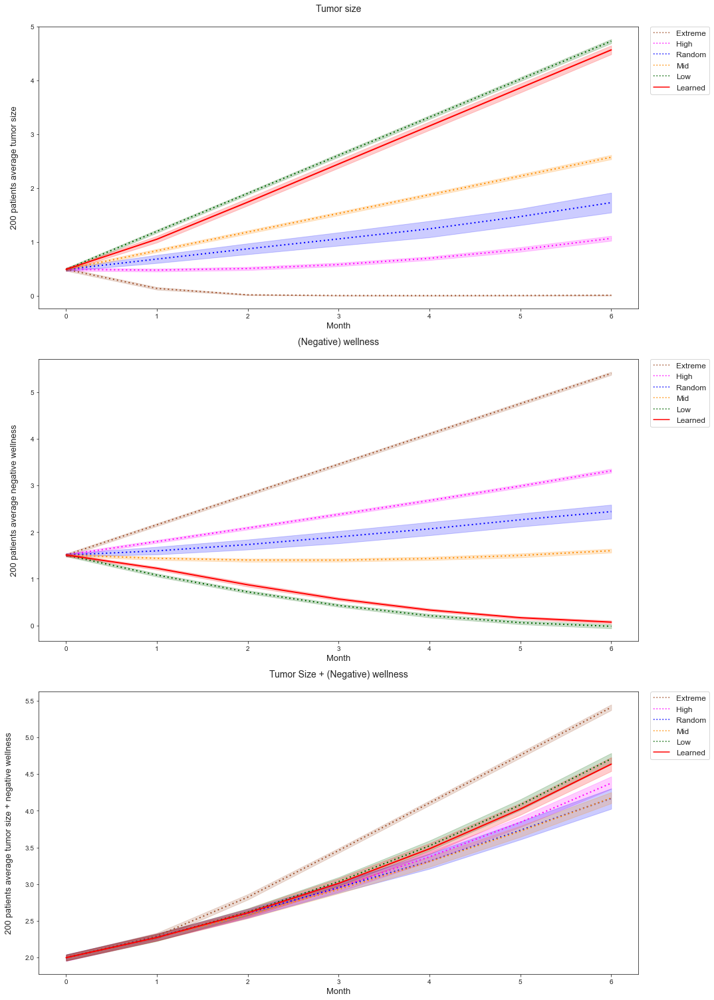


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 4.565201796483967
                         - Avg. max. toxicity : 1.6048904706633922
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.155688009114393
                         - Avg. prob. of death : 0.9115132685640507



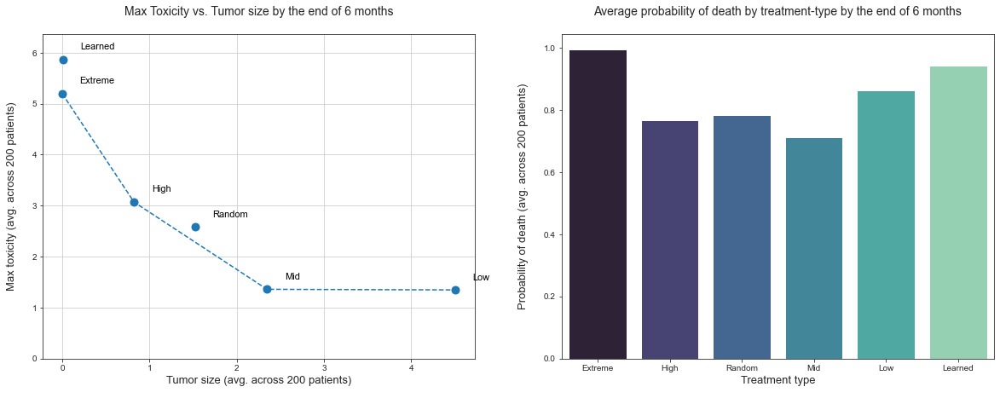

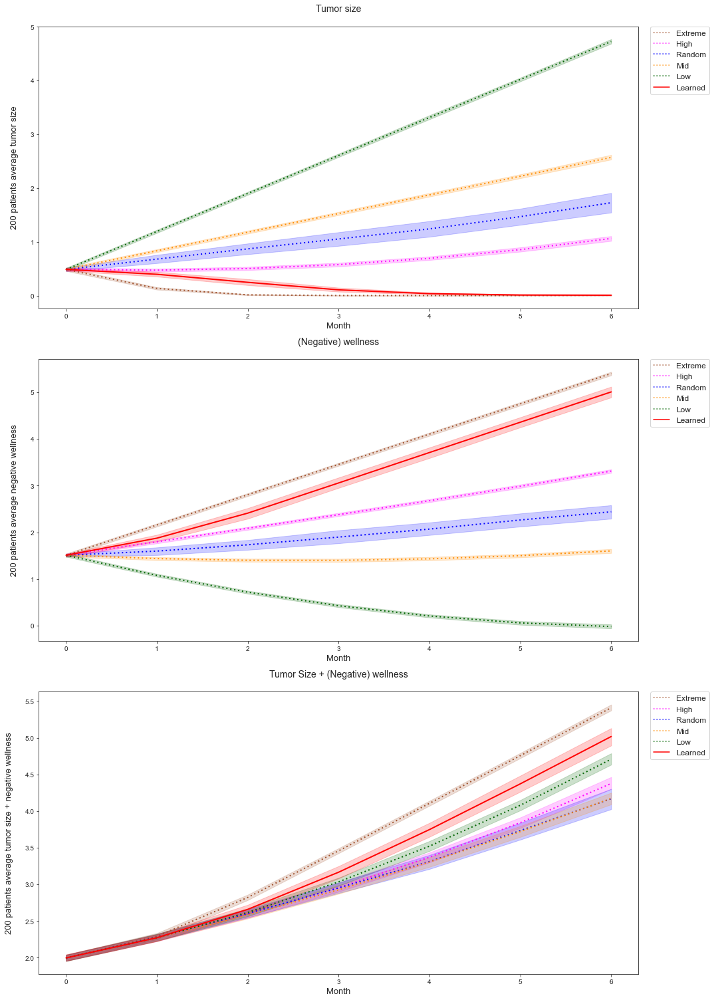


Policy Iteration: 4 - Evaluation results:
                         - Avg. ending tumor size : 0.009119062990471681
                         - Avg. max. toxicity : 5.864437709589313
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1843708380166884
                         - Avg. prob. of death : 0.9409414062538844



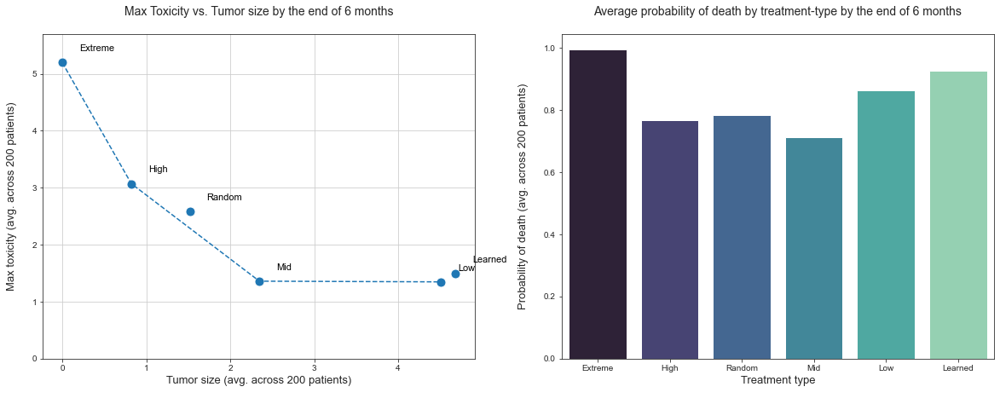

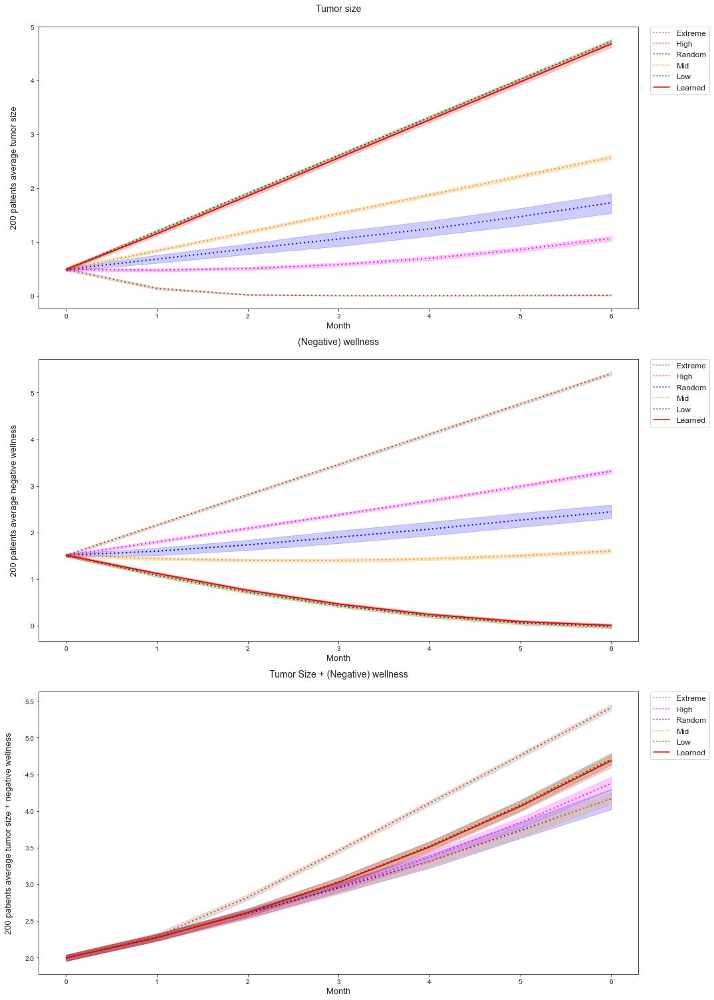


Policy Iteration: 5 - Evaluation results:
                         - Avg. ending tumor size : 4.6807072569114085
                         - Avg. max. toxicity : 1.4834092929904505
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.159042167973853
                         - Avg. prob. of death : 0.9256264240318635



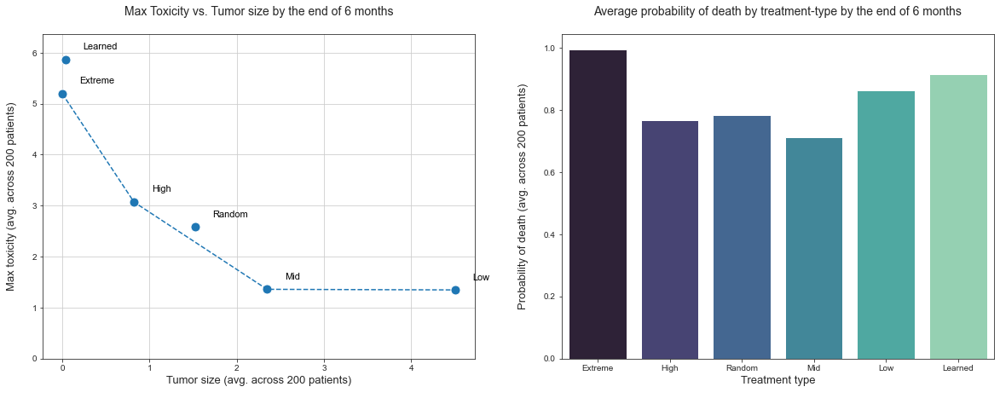

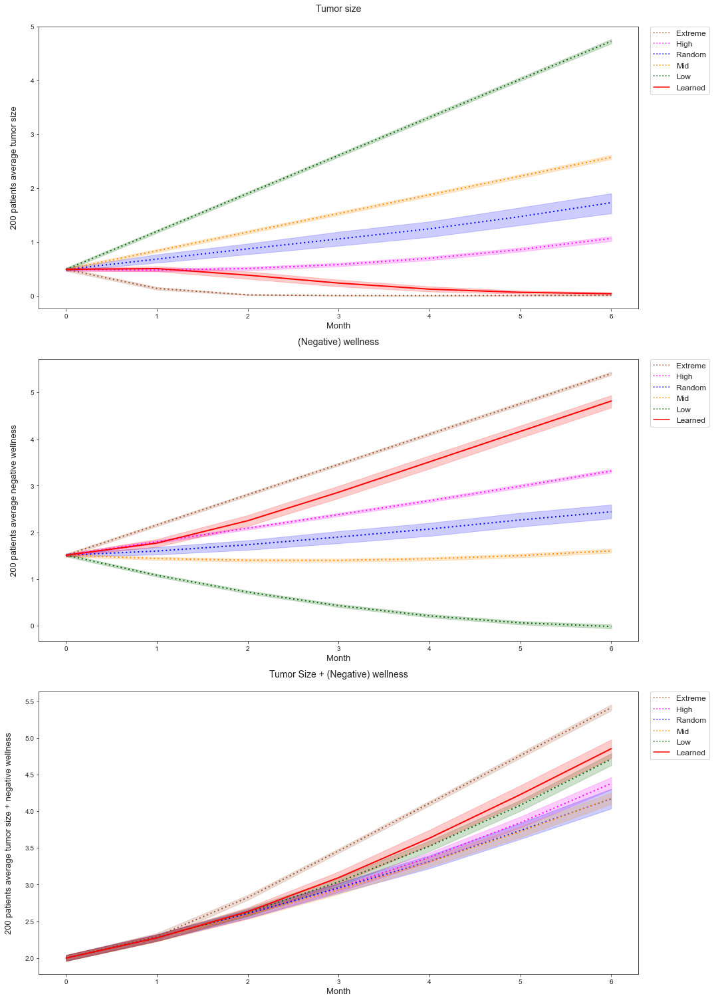


Policy Iteration: 6 - Evaluation results:
                         - Avg. ending tumor size : 0.03733139629923555
                         - Avg. max. toxicity : 5.864437709589313
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.171679204812193
                         - Avg. prob. of death : 0.9147167796258754



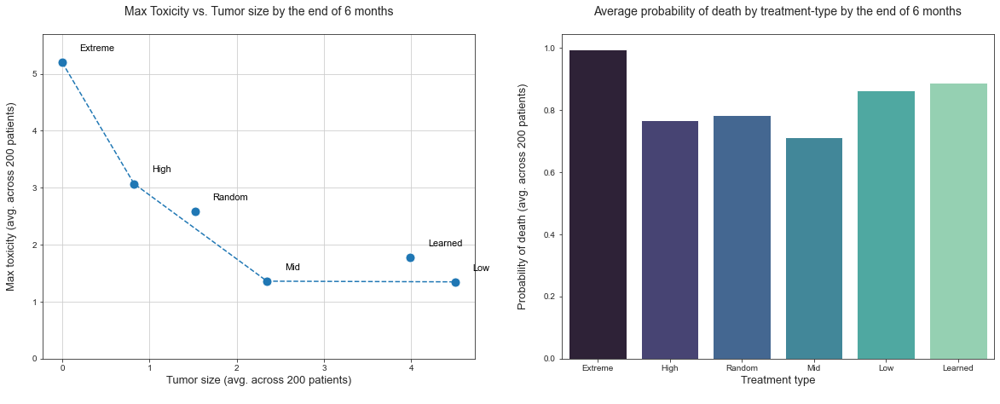

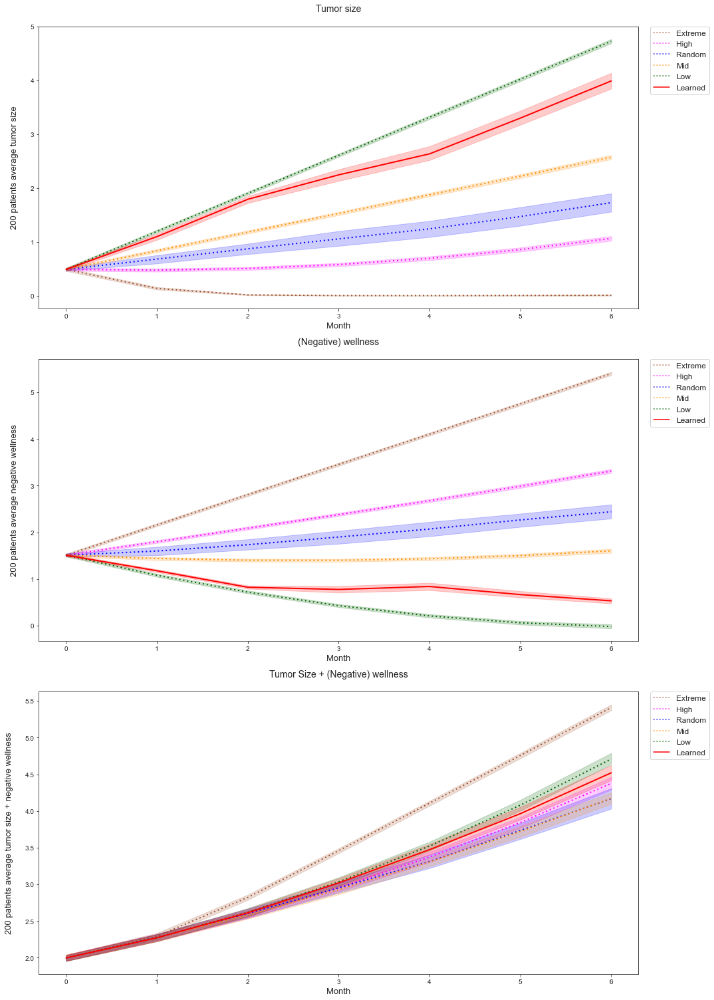


Policy Iteration: 7 - Evaluation results:
                         - Avg. ending tumor size : 3.989682577159133
                         - Avg. max. toxicity : 1.7719508852790562
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1516334442241765
                         - Avg. prob. of death : 0.8881909518300027



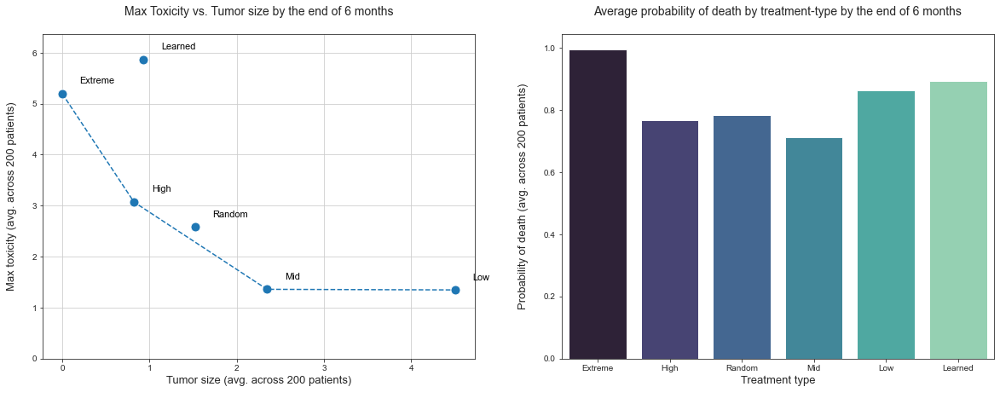

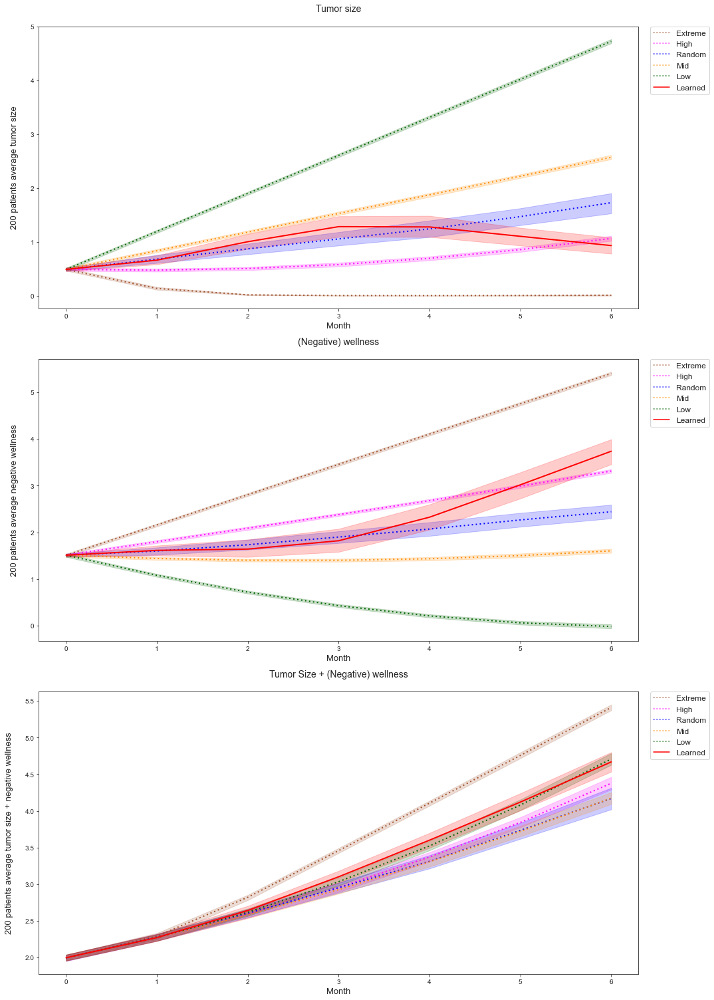


Policy Iteration: 8 - Evaluation results:
                         - Avg. ending tumor size : 0.9316192817514337
                         - Avg. max. toxicity : 5.864437709589313
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1645866460067253
                         - Avg. prob. of death : 0.8924605644544396



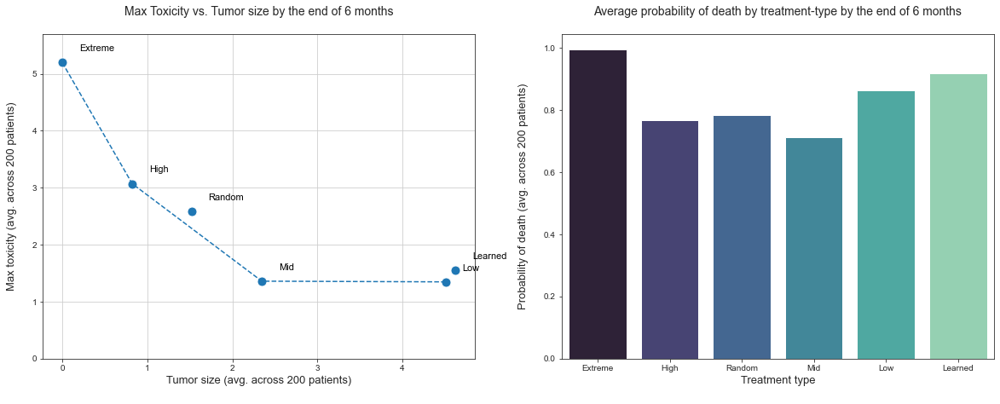

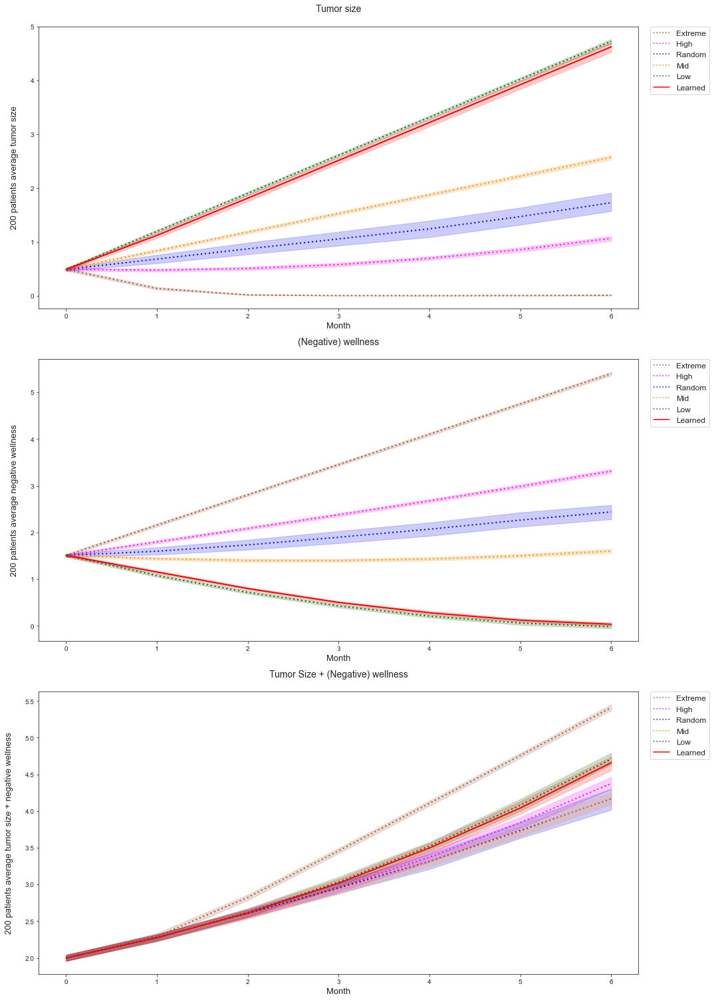


Policy Iteration: 9 - Evaluation results:
                         - Avg. ending tumor size : 4.623954521592967
                         - Avg. max. toxicity : 1.546593530653449
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1572333922085574
                         - Avg. prob. of death : 0.9177639333487392



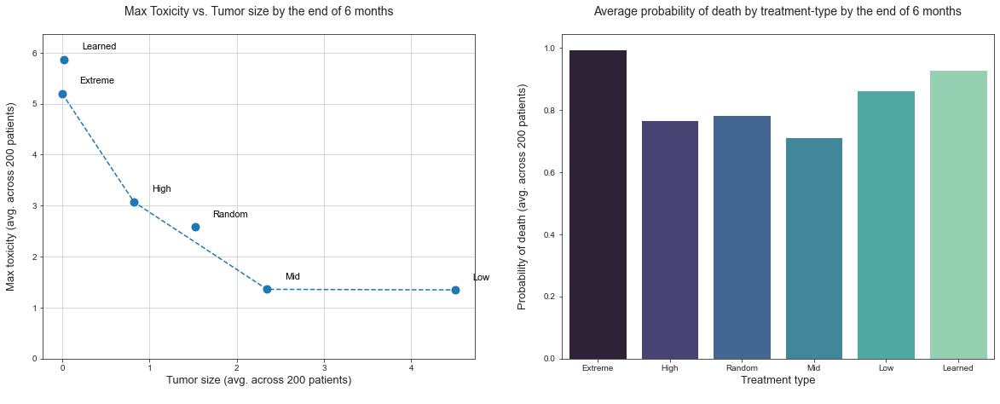

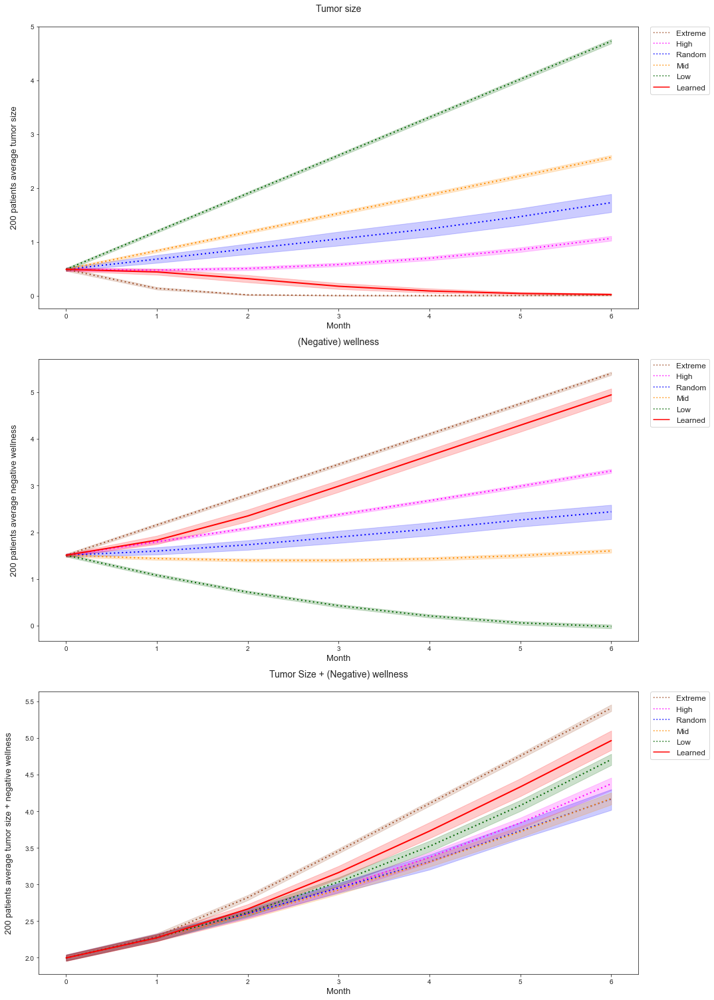


Policy Iteration: 10 - Evaluation results:
                         - Avg. ending tumor size : 0.022776823420551314
                         - Avg. max. toxicity : 5.864437709589313
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1819064552916503
                         - Avg. prob. of death : 0.9273874465977714


Evaluations: 100%|██████████| 1/1 [3:29:12<00:00, 12552.13s/it]


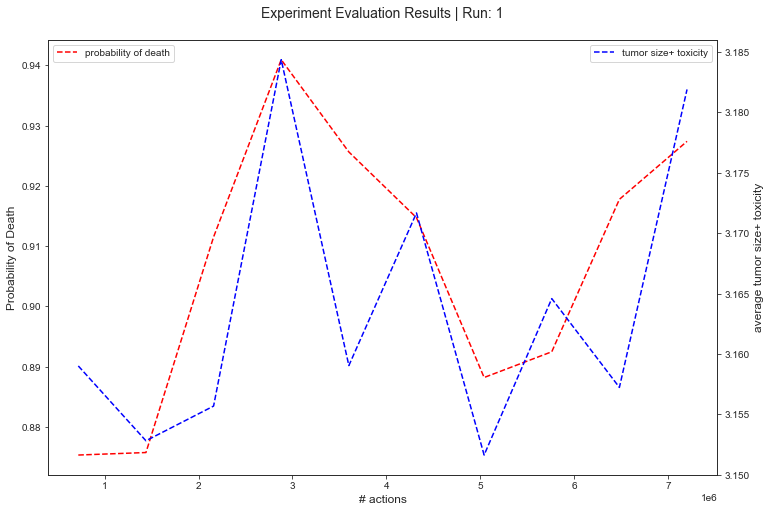

In [4]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 6
                                                , treatment_length_eval     = 6
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = False # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 3
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

### Modified algorithm

In [5]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 2
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': 'group_2'
          , 'init_state_tag': 'g2'
          }

algorithm = ALGO_TYPE['modified']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 3


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


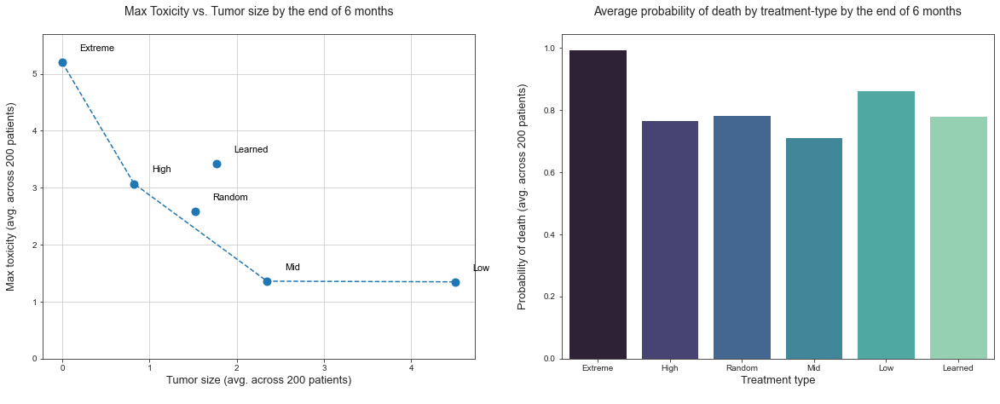

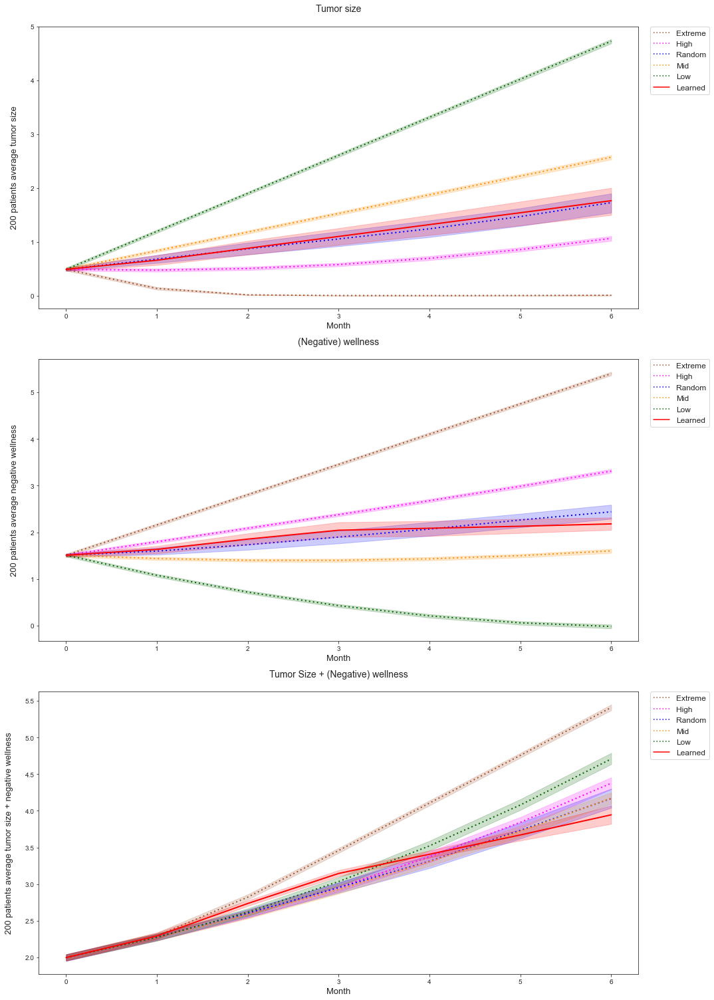


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 1.7646581384865236
                         - Avg. max. toxicity : 3.4247915049769886
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.135813033320795
                         - Avg. prob. of death : 0.7813677379922495



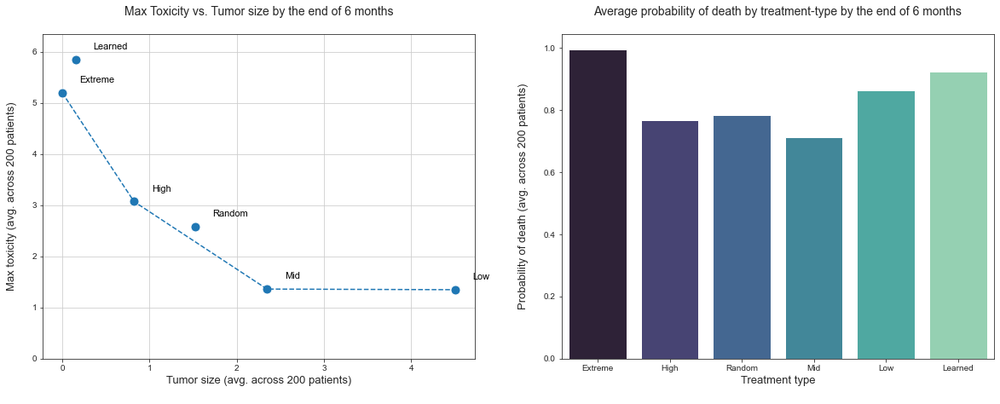

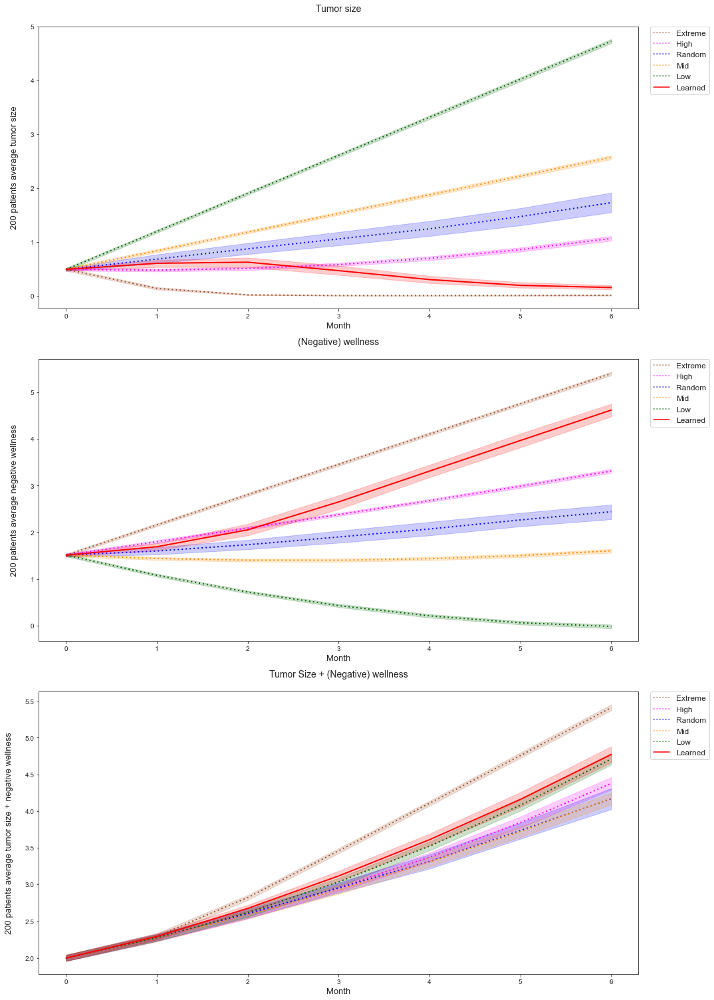


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 0.15203446237472998
                         - Avg. max. toxicity : 5.843343597184521
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.169696128212892
                         - Avg. prob. of death : 0.9220490796189523

Averege death rate increased by 10%! Policy performance decreased! Run-1 terminated!

Evaluations: 100%|██████████| 1/1 [30:19<00:00, 1819.76s/it]


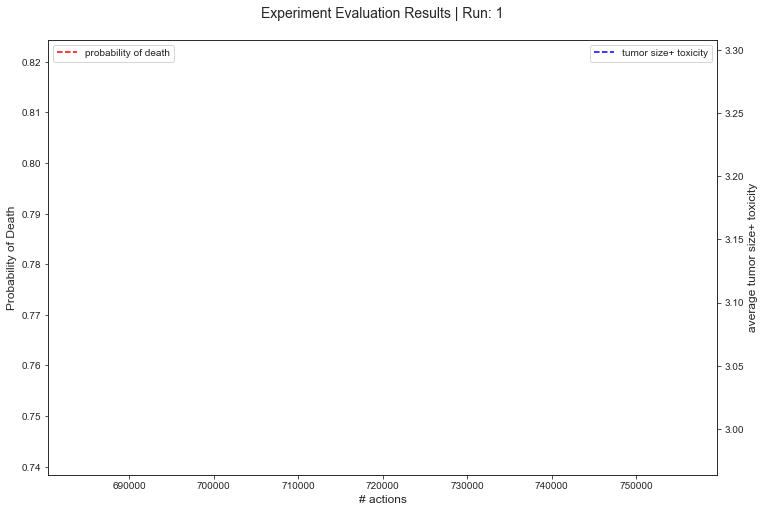

In [6]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']  
                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 6
                                                , treatment_length_eval     = 6
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = False # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 3
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

---
## Using `tumor size + toxicity` to generate preferences

### Original algorithm

In [7]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 3
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': 'group_2'
          , 'init_state_tag': 'g2'
          }

algorithm = ALGO_TYPE['original']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 3


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


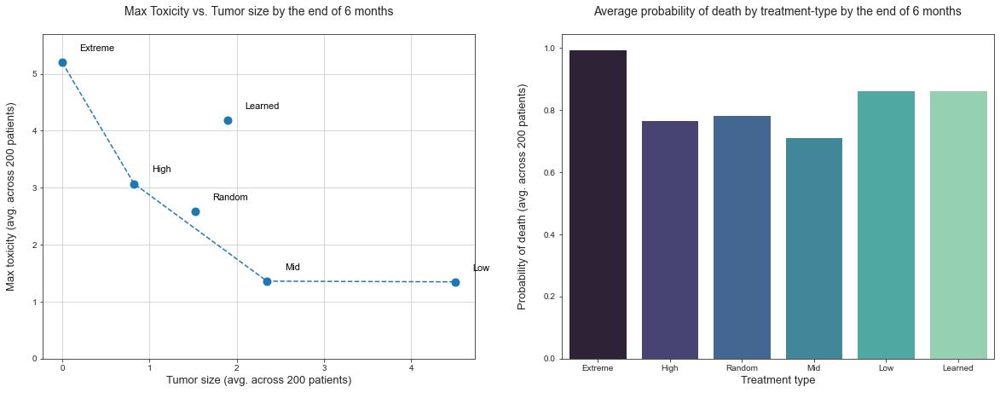

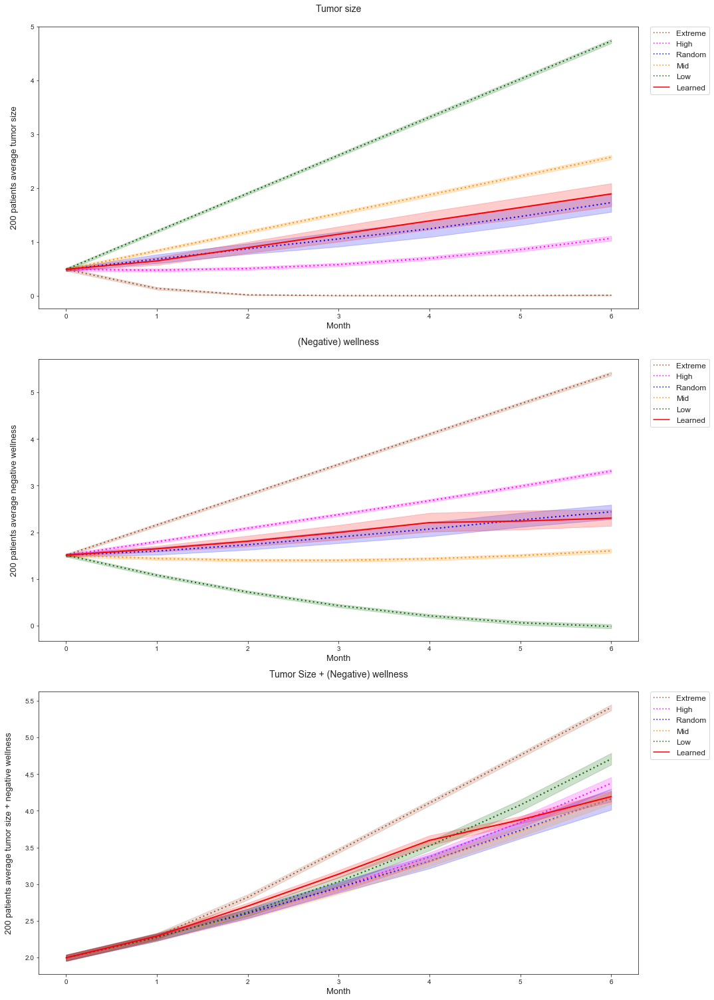


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 1.890439264942334
                         - Avg. max. toxicity : 4.177856449592623
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1502203250640646
                         - Avg. prob. of death : 0.86293731839



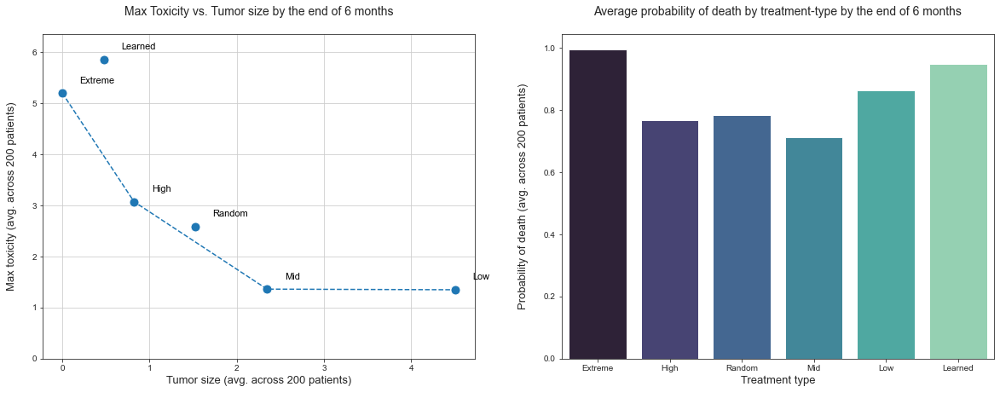

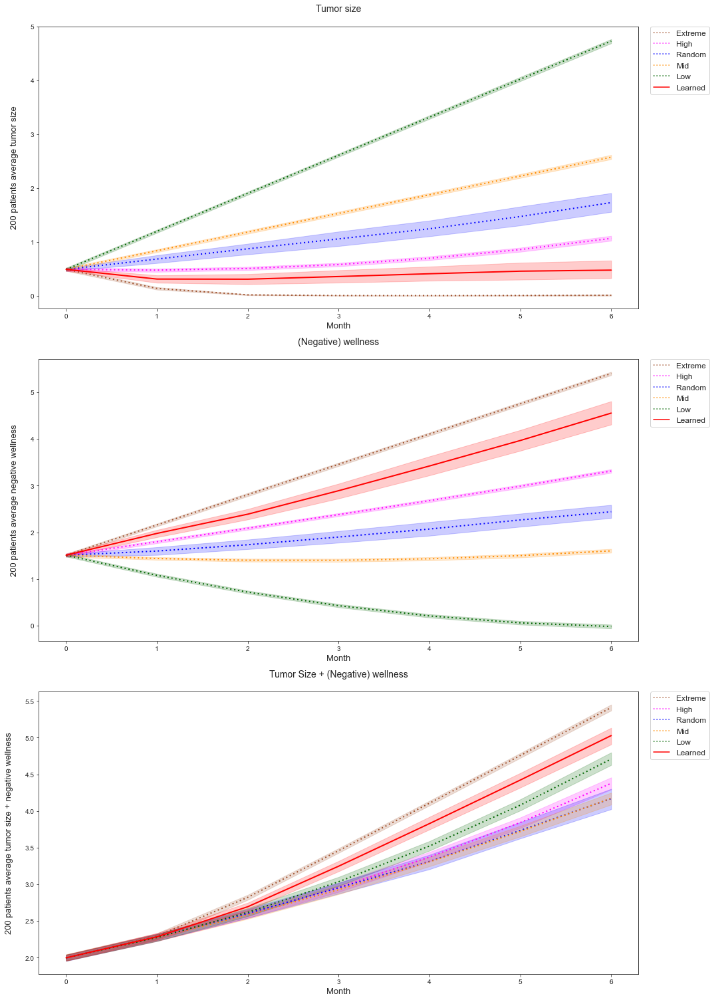


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 0.4744414557464318
                         - Avg. max. toxicity : 5.848038304664319
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1907109040203947
                         - Avg. prob. of death : 0.948413475659279



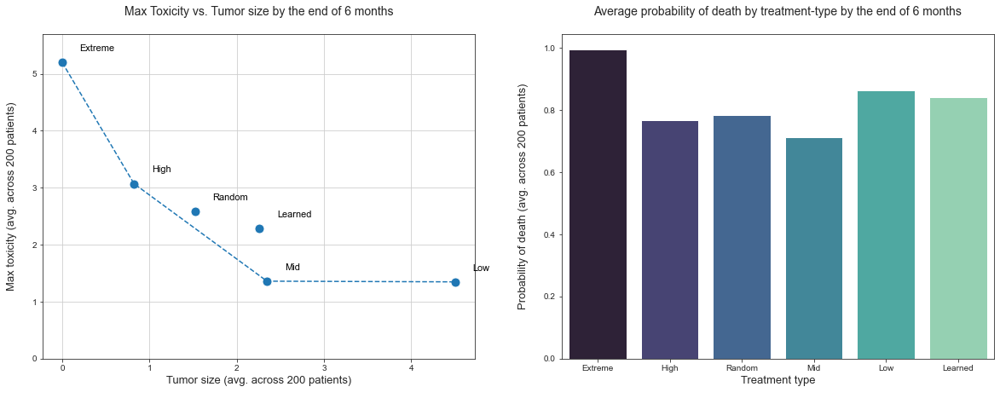

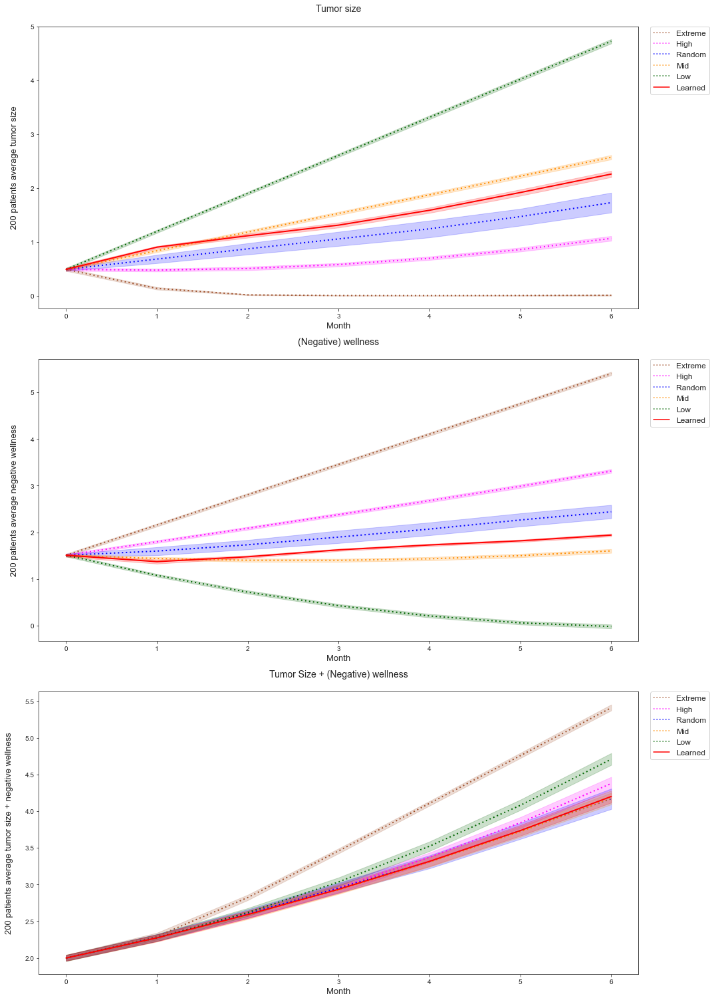


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 2.2596305403350394
                         - Avg. max. toxicity : 2.2839455175797543
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1322630447794415
                         - Avg. prob. of death : 0.8408625091956071



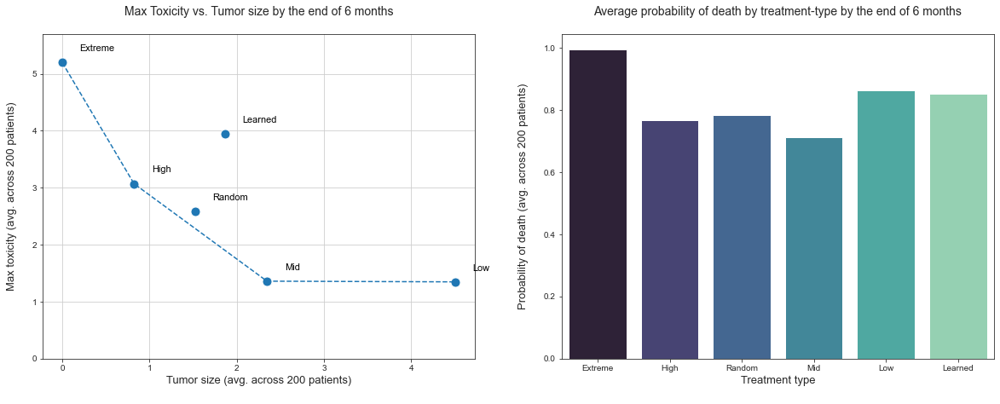

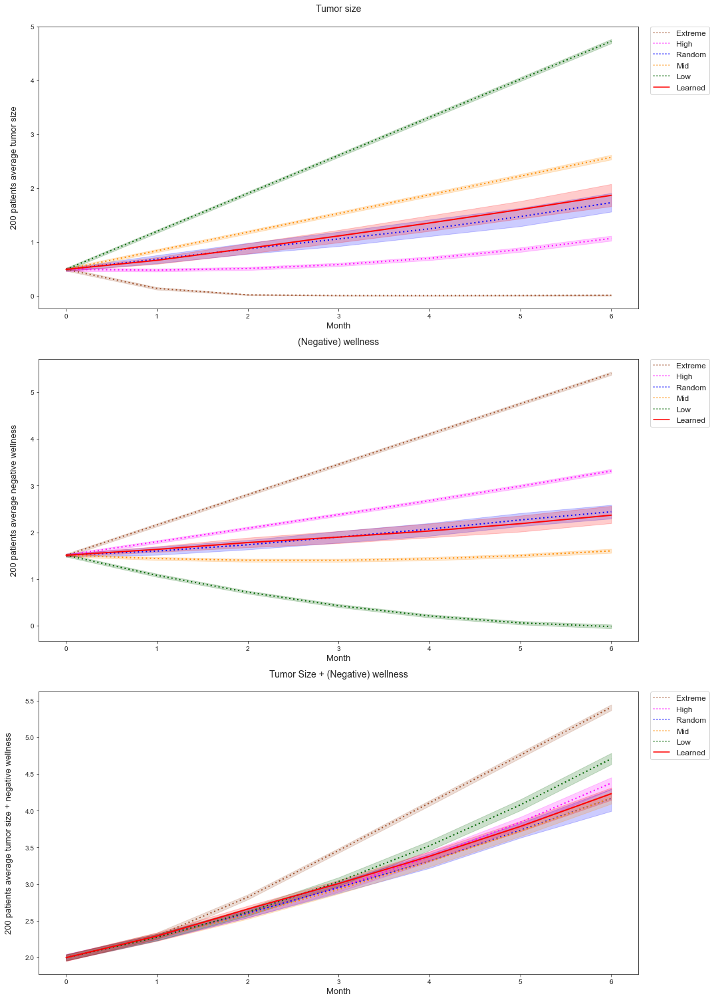


Policy Iteration: 4 - Evaluation results:
                         - Avg. ending tumor size : 1.8649129345932616
                         - Avg. max. toxicity : 3.9409366153676193
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1395764007108244
                         - Avg. prob. of death : 0.8508774164741739



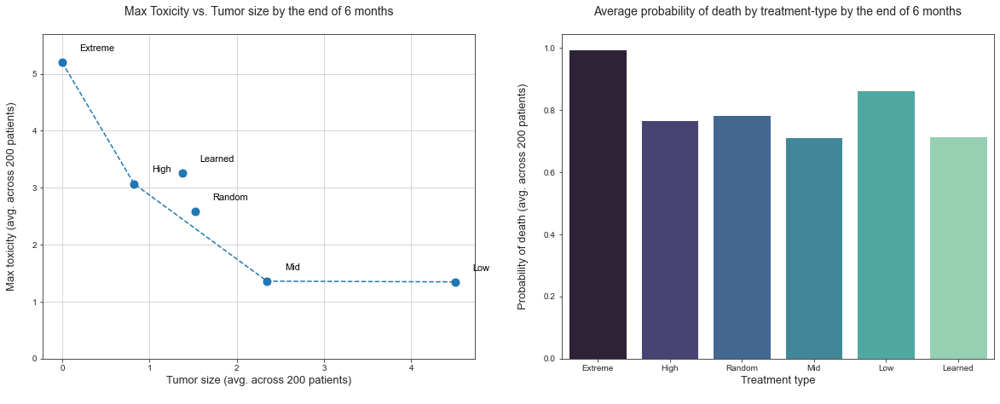

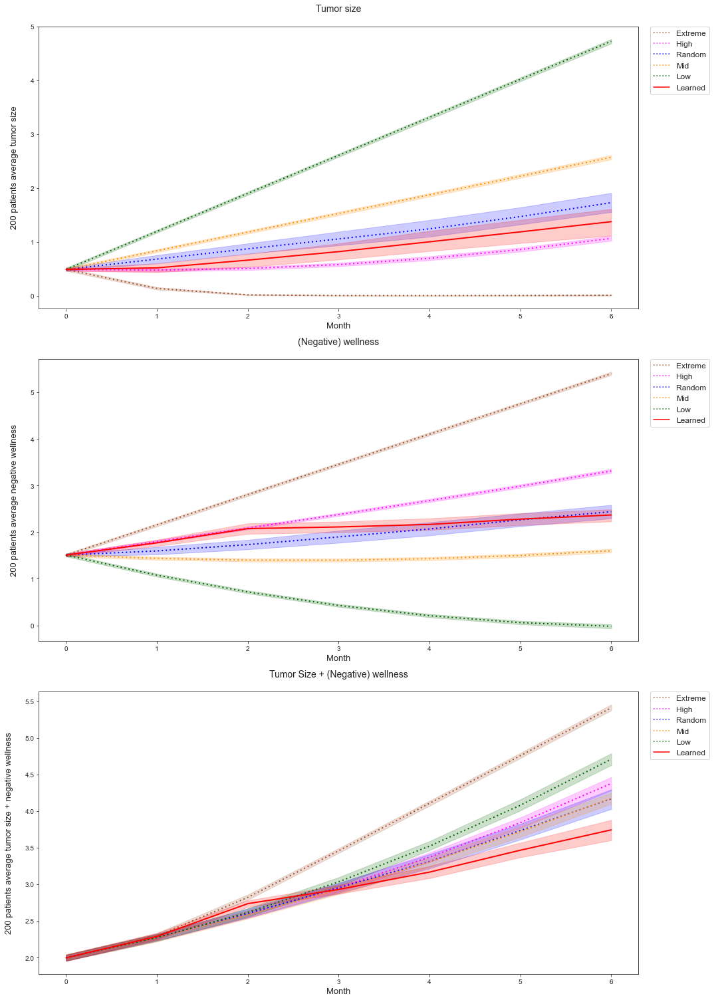


Policy Iteration: 5 - Evaluation results:
                         - Avg. ending tumor size : 1.3748832585790518
                         - Avg. max. toxicity : 3.25867608549185
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1152703697583317
                         - Avg. prob. of death : 0.7134482503532878



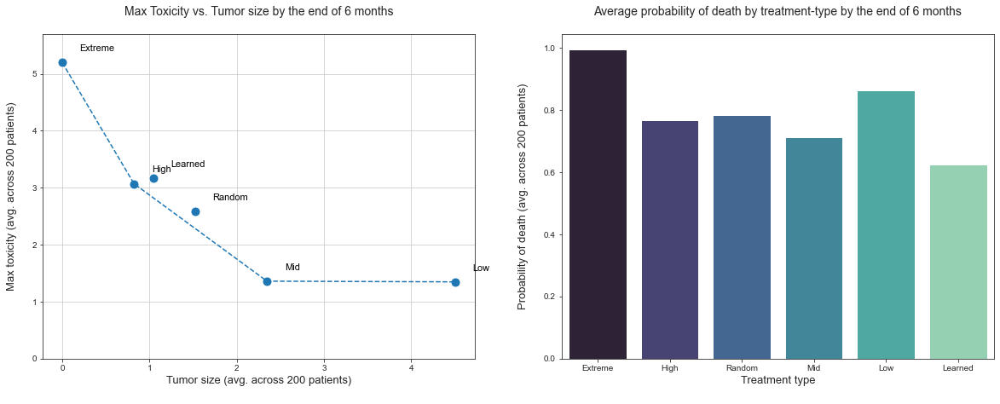

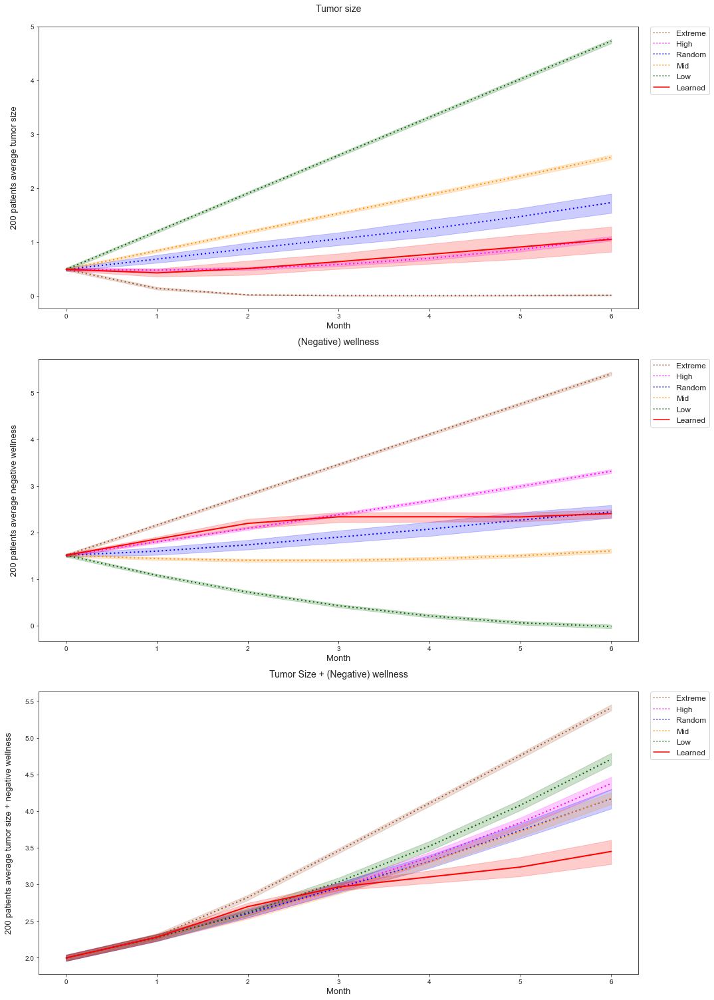


Policy Iteration: 6 - Evaluation results:
                         - Avg. ending tumor size : 1.0462211386882256
                         - Avg. max. toxicity : 3.172624017286519
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1009367204107066
                         - Avg. prob. of death : 0.6230615879433481



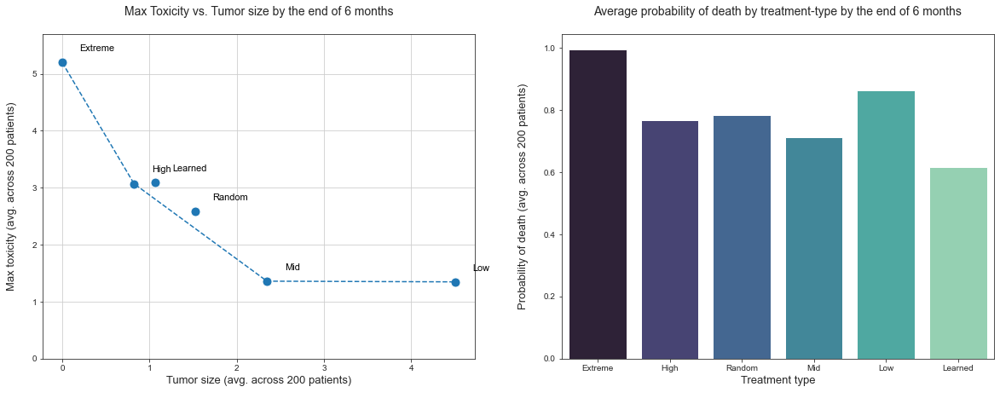

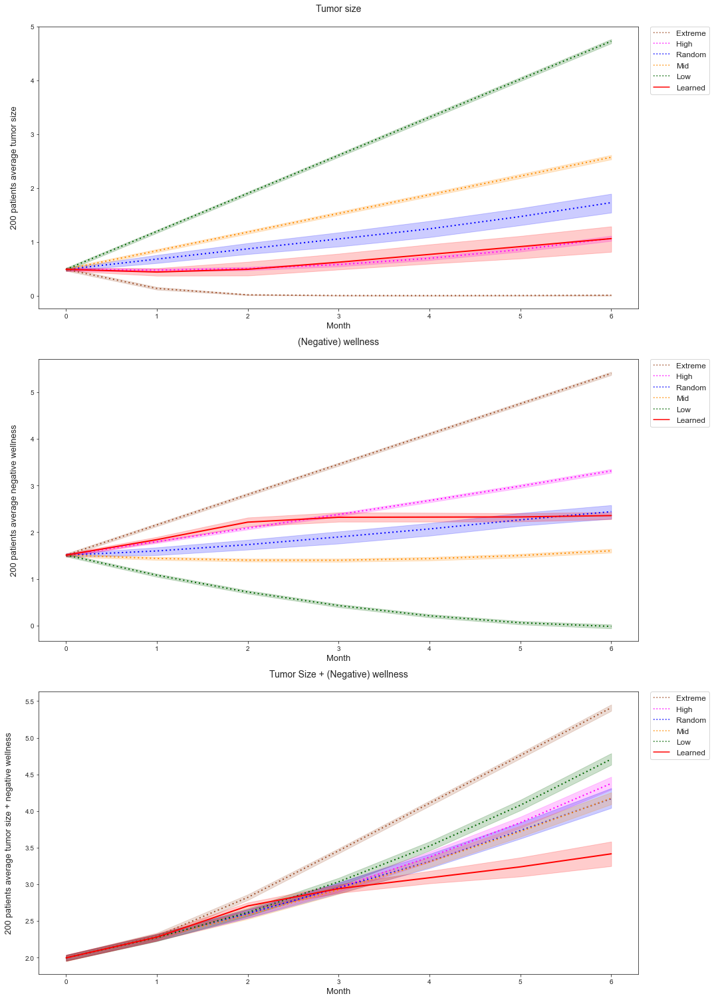


Policy Iteration: 7 - Evaluation results:
                         - Avg. ending tumor size : 1.0603060771897892
                         - Avg. max. toxicity : 3.0937908122397033
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.0995192582473186
                         - Avg. prob. of death : 0.6163454979041425



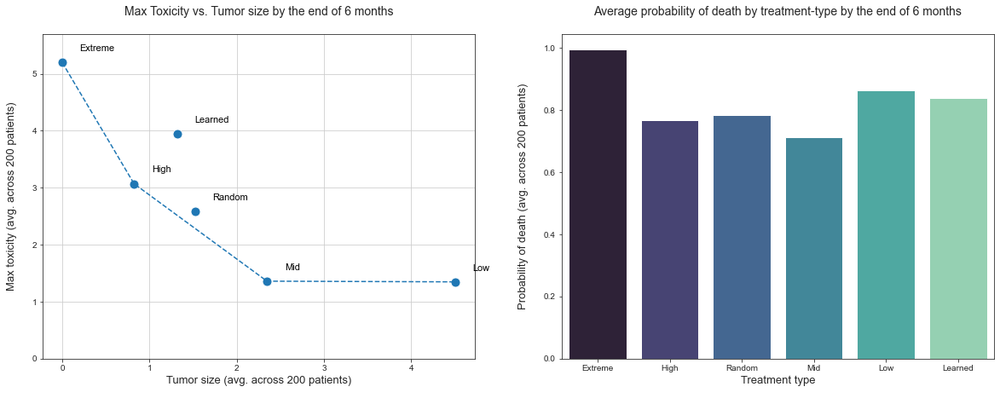

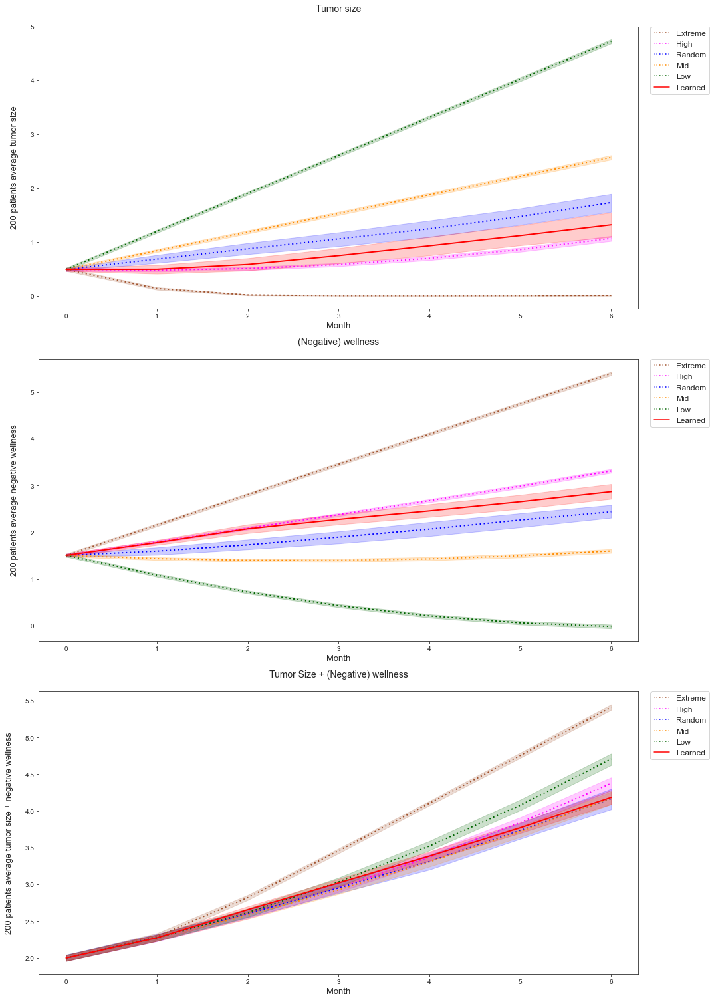


Policy Iteration: 8 - Evaluation results:
                         - Avg. ending tumor size : 1.316078920910834
                         - Avg. max. toxicity : 3.941301508982444
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1381490773750986
                         - Avg. prob. of death : 0.8384603942078209

Averege death rate increased by 10%! Policy performance decreased! Run-1 terminated!

Evaluations: 100%|██████████| 1/1 [2:21:59<00:00, 8519.46s/it]


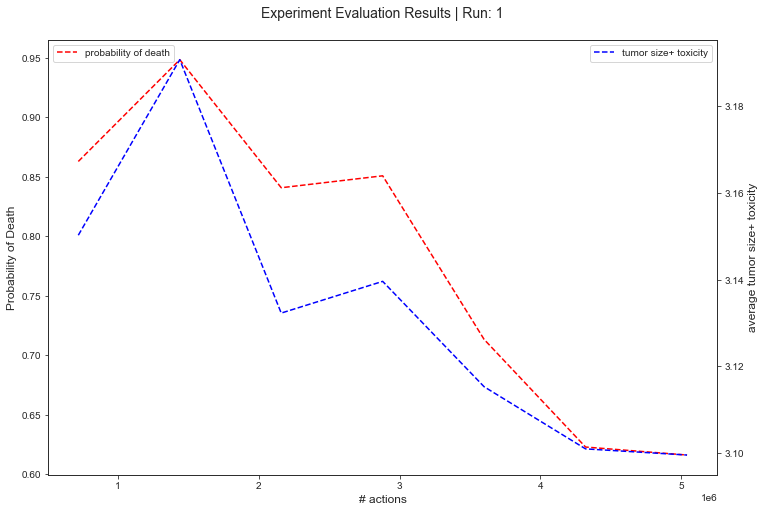

In [8]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 6
                                                , treatment_length_eval     = 6
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = True # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 3
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

### Modified algorithm

In [15]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 4
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': 'group_2'
          , 'init_state_tag': 'g2'
          }

algorithm = ALGO_TYPE['modified']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 3


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


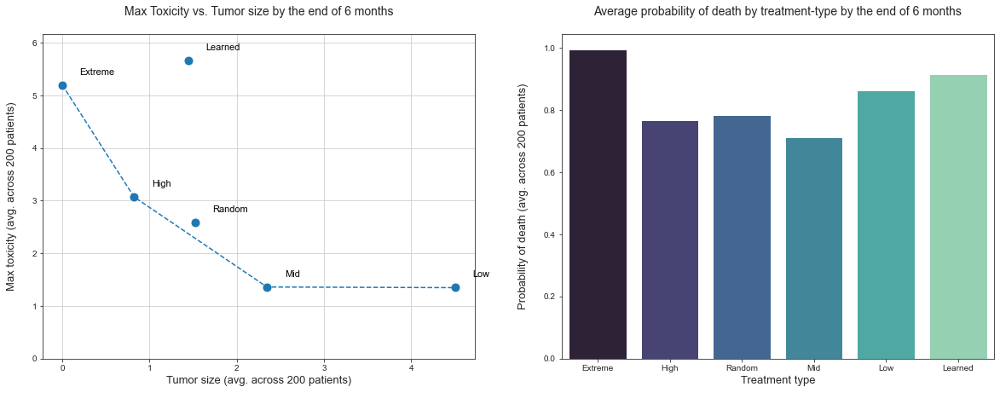

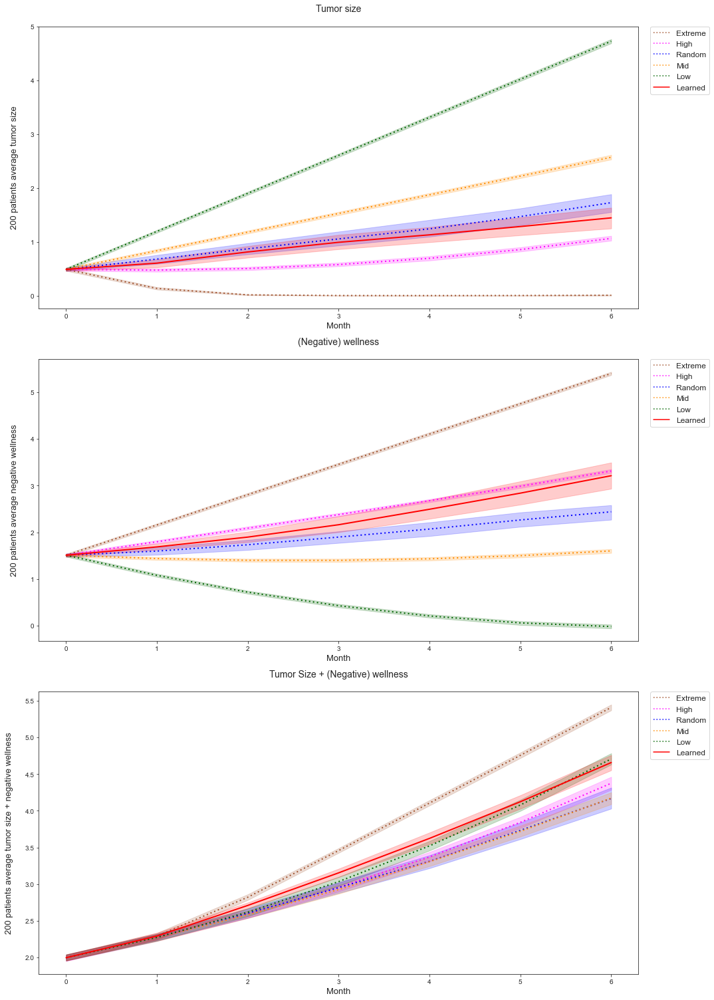


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 1.4458432187684713
                         - Avg. max. toxicity : 5.6596622091483075
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1683514663588017
                         - Avg. prob. of death : 0.9132967172654066



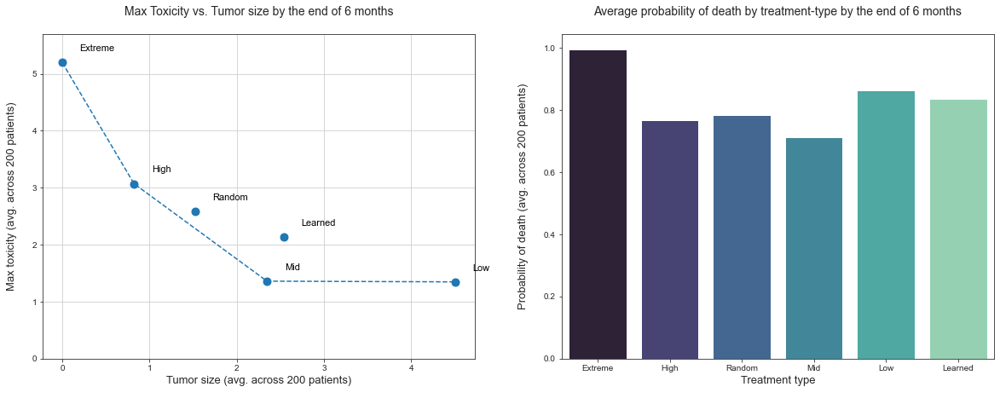

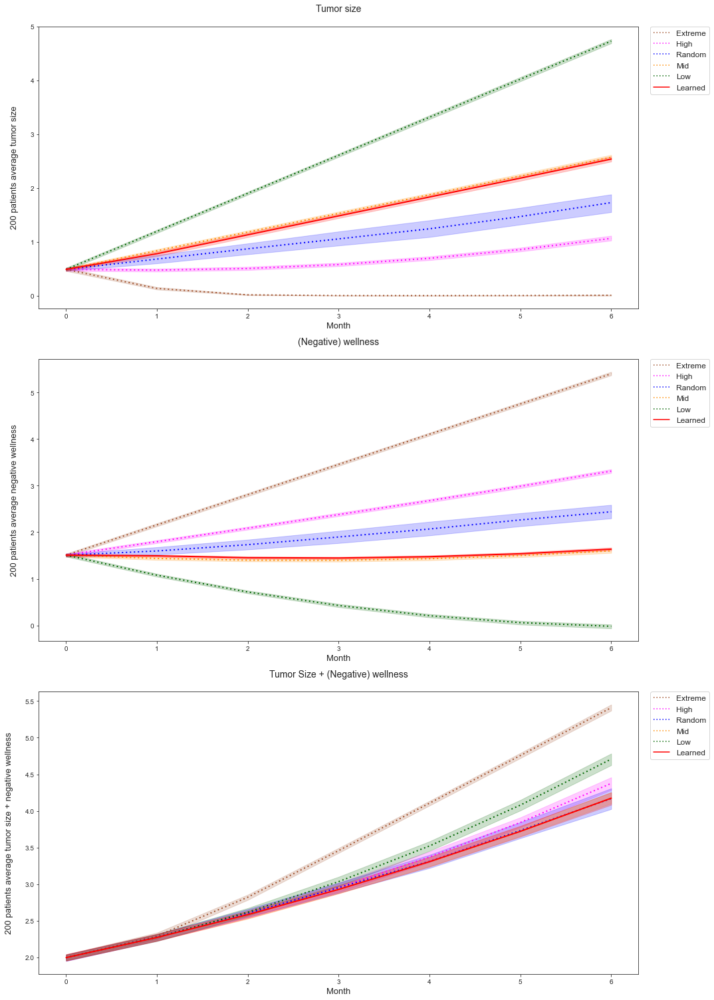


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 2.5374831619370055
                         - Avg. max. toxicity : 2.1381165766074663
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1308405825035024
                         - Avg. prob. of death : 0.8351393380162274



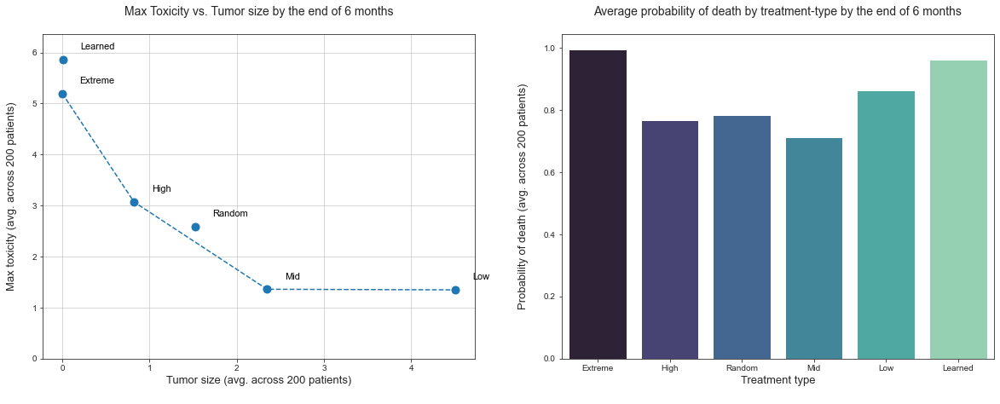

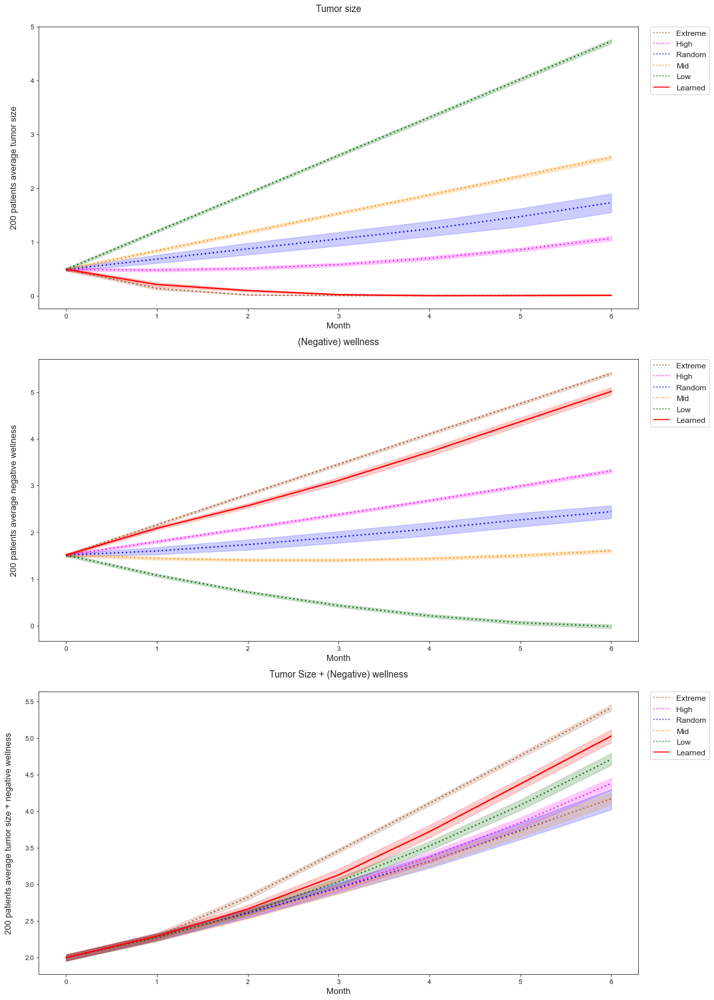


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 0.008264274217505281
                         - Avg. max. toxicity : 5.859128137687682
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1833598293113403
                         - Avg. prob. of death : 0.9599714884701248

Averege death rate increased by 10%! Policy performance decreased! Run-1 terminated!

Evaluations: 100%|██████████| 1/1 [33:55<00:00, 2035.10s/it]


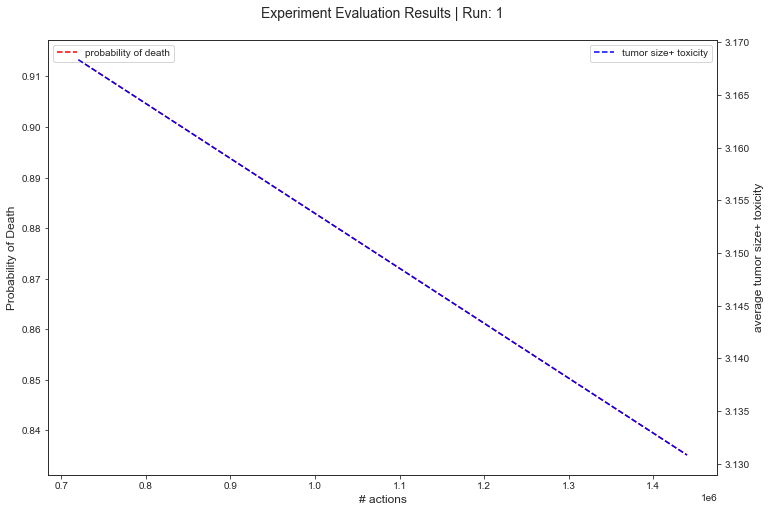

In [14]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 6
                                                , treatment_length_eval     = 6
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = True # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 3
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

---
## TO-DO: Lengthier treatment regime - 6 months training data -> 12 months evaluation